# YOLOv8 Training for Recyclable Object Detection

This notebook trains a YOLOv8 model to detect recyclable items (Plastic, Glass, Metal)


## 1. Install Required Libraries


In [8]:
# Install ultralytics (YOLOv8)
!pip3 install ultralytics opencv-python pillow matplotlib



[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


## 2. Import Libraries


In [9]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os
import yaml
import numpy as np


## 3. Update Dataset Configuration

We need to update the data.yaml file with absolute paths


In [11]:
import os
import yaml

# Dataset is already extracted - use existing folder
dataset_path = '/Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset'
data_yaml_path = os.path.join(dataset_path, 'data.yaml')

print("✅ Using existing dataset at:", dataset_path)
print("\nDataset structure:")
print(f"  Training images: {len(os.listdir(os.path.join(dataset_path, 'train/images')))}")
print(f"  Validation images: {len(os.listdir(os.path.join(dataset_path, 'valid/images')))}")
print(f"  Test images: {len(os.listdir(os.path.join(dataset_path, 'test/images')))}")

# Read the current data.yaml
with open(data_yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

print("\nOriginal configuration:")
print(data_config)

# Update paths to point to the correct locations on Mac
data_config['train'] = os.path.join(dataset_path, 'train/images')
data_config['val'] = os.path.join(dataset_path, 'valid/images')
data_config['test'] = os.path.join(dataset_path, 'test/images')

# Update class names to be more descriptive
data_config['names'] = ['Plastic', 'Glass', 'Metal']

# Save the updated config
updated_yaml_path = os.path.join(dataset_path, 'data_updated.yaml')
with open(updated_yaml_path, 'w') as f:
    yaml.dump(data_config, f, default_flow_style=False)

print("\n✅ Updated configuration:")
print(data_config)
print(f"\nYAML saved at: {updated_yaml_path}")



✅ Using existing dataset at: /Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset

Dataset structure:
  Training images: 6882
  Validation images: 1955
  Test images: 964

Original configuration:
{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 3, 'names': ['1', '1 1 1 0 0', '2'], 'roboflow': {'workspace': 'testproject001-ctfps', 'project': 'recyclable-non-recyclable-model', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/testproject001-ctfps/recyclable-non-recyclable-model/dataset/1'}}

✅ Updated configuration:
{'train': '/Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/train/images', 'val': '/Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/valid/images', 'test': '/Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/test/images', 'nc': 3, 'names': ['Plastic', 'Glass', 'Metal'], 'roboflow': {'workspace': 'testproject001-ctfps', 'project': 'recyclable-non-recyclable-model', 'version': 1, 'licen

## 4. Explore the Dataset


In [12]:
# Check dataset statistics
train_images = os.listdir(os.path.join(dataset_path, 'train/images'))
val_images = os.listdir(os.path.join(dataset_path, 'valid/images'))
test_images = os.listdir(os.path.join(dataset_path, 'test/images'))

print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")
print(f"Test images: {len(test_images)}")
print(f"Total images: {len(train_images) + len(val_images) + len(test_images)}")


Training images: 6882
Validation images: 1955
Test images: 964
Total images: 9801


## 5. Visualize Sample Images with Labels


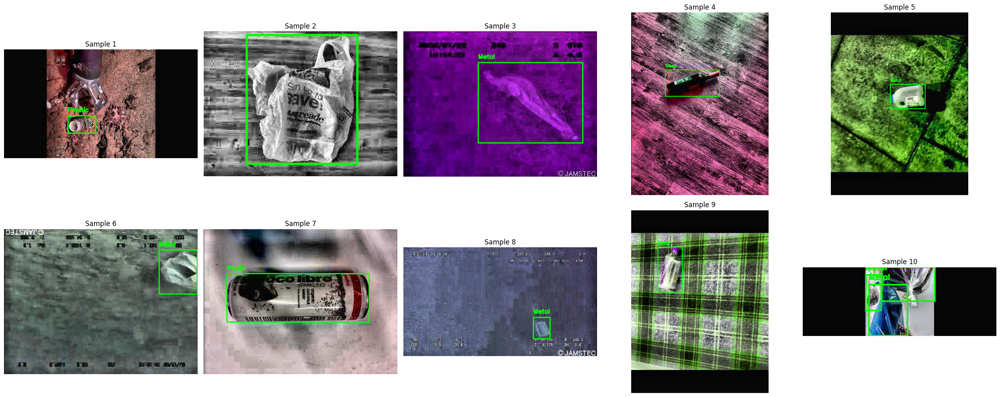

In [15]:
def visualize_yolo_labels(image_path, label_path, class_names):
    """
    Visualize YOLO format labels on image
    """
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Read labels
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            labels = f.readlines()

        # Draw bounding boxes
        for label in labels:
            class_id, x_center, y_center, width, height = map(float, label.strip().split())
            class_id = int(class_id)

            # Convert YOLO format to pixel coordinates
            x_center *= w
            y_center *= h
            width *= w
            height *= h

            x1 = int(x_center - width / 2)
            y1 = int(y_center - height / 2)
            x2 = int(x_center + width / 2)
            y2 = int(y_center + height / 2)

            # Draw rectangle
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Put class name
            class_name = class_names[class_id] if class_id < len(class_names) else f"Class {class_id}"
            cv2.putText(img, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return img

# Get list of training images
train_images = os.listdir(os.path.join(dataset_path, 'train/images'))

# Visualize 10 random training images
fig, axes = plt.subplots(2, 5, figsize=(25, 10))
axes = axes.flatten()

class_names = ['Plastic', 'Glass', 'Metal']
sample_images = np.random.choice([img for img in train_images if img.endswith('.jpg')], 10, replace=False)

for idx, img_name in enumerate(sample_images):
    img_path = os.path.join(dataset_path, 'train/images', img_name)
    label_path = os.path.join(dataset_path, 'train/labels', img_name.replace('.jpg', '.txt'))

    img = visualize_yolo_labels(img_path, label_path, class_names)
    axes[idx].imshow(img)
    axes[idx].set_title(f"Sample {idx+1}")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()


## 6. Load Pre-trained YOLOv8 Model

We'll start with a pre-trained YOLOv8n (nano) model for faster training


In [16]:
# Load a pre-trained YOLOv8 model
# Options: yolov8n.pt (nano), yolov8s.pt (small), yolov8m.pt (medium), yolov8l.pt (large), yolov8x.pt (extra large)
model = YOLO('yolov8n.pt')  # nano model for faster training

print("Model loaded successfully!")
print(f"Model summary:")
model.info()


Model loaded successfully!
Model summary:
YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs


(225, 3157200, 0, 8.8575488)

## 7. Train the Model


In [ ]:
# Train the model
results = model.train(
    data=updated_yaml_path,           # path to data.yaml
    epochs=25,                         # number of training epochs
    imgsz=640,                         # input image size
    batch=16,                          # batch size (adjust based on your GPU memory)
    name='recyclable_detection',       # project name
    project='runs/detect',             # where to save results
    patience=10,                       # early stopping patience
    save=True,                         # save checkpoints
    plots=True,                        # save plots
    device='mps',                      # use 'mps' for Mac M1/M2, 'cuda' for NVIDIA GPU, or 'cpu'
    workers=4,                         # number of workers for data loading
    optimizer='Adam',                  # optimizer (Adam, SGD, etc.)
    lr0=0.01,                         # initial learning rate
    verbose=True                       # verbose output
)

print("\nTraining completed!")


Ultralytics 8.3.207 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data_updated.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=recyclable_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=10, perspective=0.0, p

## 8. View Training Results


In [17]:
# Display training plots
results_path = 'runs/detect/recyclable_detection'

# Check if results exist
if os.path.exists(results_path):
    # Display confusion matrix
    if os.path.exists(f'{results_path}/confusion_matrix.png'):
        img = Image.open(f'{results_path}/confusion_matrix.png')
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title('Confusion Matrix')
        plt.show()

    # Display training results
    if os.path.exists(f'{results_path}/results.png'):
        img = Image.open(f'{results_path}/results.png')
        plt.figure(figsize=(15, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.title('Training Results')
        plt.show()
else:
    print(f"Results not found at {results_path}")


## 9. Validate the Model


In [22]:
# Load the best trained model
best_model_path = f'{results_path}/weights/best.pt'

if os.path.exists(best_model_path):
    trained_model = YOLO(best_model_path)

    # Validate on validation set
    validation_results = trained_model.val(
        data=updated_yaml_path,
        split='val'
    )

    print("\nValidation Metrics:")
    print(f"mAP50: {validation_results.box.map50:.4f}")
    print(f"mAP50-95: {validation_results.box.map:.4f}")
    print(f"Precision: {validation_results.box.mp:.4f}")
    print(f"Recall: {validation_results.box.mr:.4f}")
else:
    print(f"Model not found at {best_model_path}. Please complete training first.")


Ultralytics YOLOv8.2.28 🚀 Python-3.10.11 torch-2.3.1 CPU (Apple M2)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/valid/labels.cache... 1955 images, 2 backgrounds, 0 corrupt: 100%|██████████| 1955/1955 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 123/123 [13:49<00:00,  6.75s/it]


                   all       1955       2403      0.769      0.664      0.749      0.527
               Plastic        567        670      0.811      0.575      0.694      0.464
                 Glass        425        632      0.722       0.75      0.808      0.604
                 Metal       1003       1101      0.774      0.667      0.744      0.511
Speed: 2.0ms preprocess, 416.3ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/val4

Validation Metrics:
mAP50: 0.7486
mAP50-95: 0.5265
Precision: 0.7688
Recall: 0.6638


## 10. Test on Sample Images



image 1/1 /Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/test/images/obj0313_frame0000053_jpg.rf.861540cedd4d0b66e6a96707c9de7a03.jpg: 480x640 1 Metal, 162.6ms
Speed: 4.0ms preprocess, 162.6ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/test/images/PET534_jpg.rf.c9b2679edee1c4e37791f73e8f1a6331.jpg: 640x480 1 Metal, 159.5ms
Speed: 1.7ms preprocess, 159.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/test/images/obj1618_frame0000005_jpg.rf.71bc06aa11e2b1066a9e88671fc59c69.jpg: 480x640 1 Metal, 163.2ms
Speed: 1.8ms preprocess, 163.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/test/images/Glass986_jpg.rf.acdaa1684c93d0262d1fd03f586d33a6.jpg: 640x480 1 Glass, 142.7ms
Speed: 3.6ms preprocess, 142.7ms inference, 

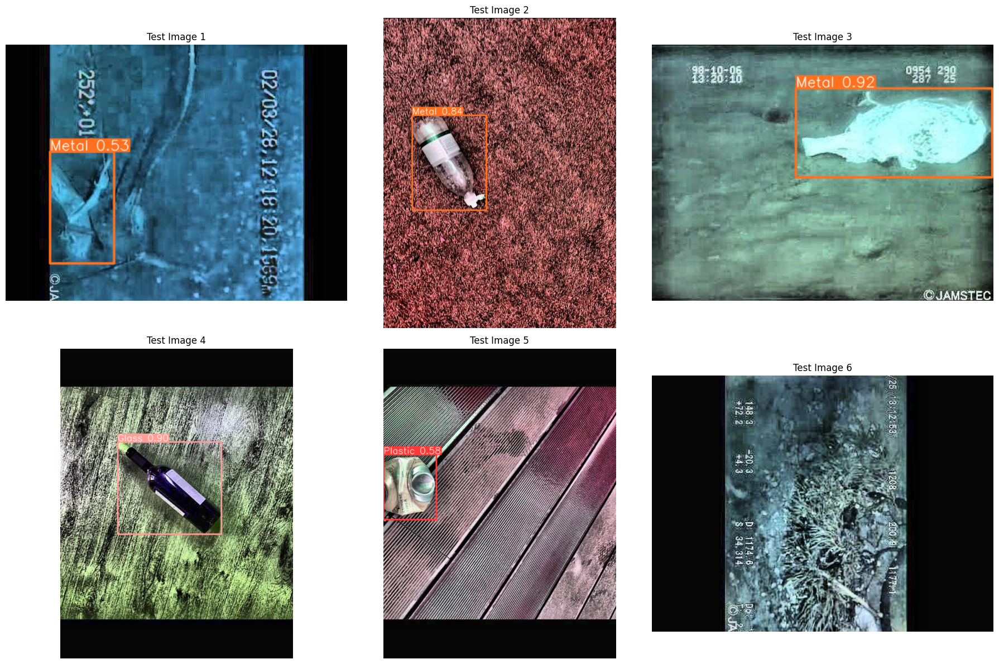

In [21]:
# Make predictions on test images
if os.path.exists(best_model_path):
    # Select random test images
    test_image_files = [f for f in test_images if f.endswith('.jpg')]
    sample_test_images = np.random.choice(test_image_files, min(6, len(test_image_files)), replace=False)

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_name in enumerate(sample_test_images):
        img_path = os.path.join(dataset_path, 'test/images', img_name)

        # Predict
        results = trained_model.predict(img_path, conf=0.50)

        # Get the plotted image with predictions
        result_img = results[0].plot()
        result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

        axes[idx].imshow(result_img)
        axes[idx].set_title(f"Test Image {idx+1}")
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Please complete training first.")


## 11. Inference on Custom Images


In [11]:
def predict_recyclable(image_path, model_path, conf_threshold=0.25):
    """
    Predict recyclable items in an image

    Args:
        image_path: Path to input image
        model_path: Path to trained model
        conf_threshold: Confidence threshold for detections
    """
    model = YOLO(model_path)
    results = model.predict(image_path, conf=conf_threshold)

    # Display results
    result_img = results[0].plot()
    result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 8))
    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Recyclable Detection Results')
    plt.show()

    # Print detection details
    print("\nDetection Details:")
    for box in results[0].boxes:
        class_id = int(box.cls)
        confidence = float(box.conf)
        class_name = results[0].names[class_id]
        print(f"  - {class_name}: {confidence:.2%} confidence")

    return results

# Example usage:
# predict_recyclable('path/to/your/image.jpg', best_model_path)


## 12. Model Performance Summary


In [ ]:
# Summary of model performance
if os.path.exists(best_model_path):
    print("="*50)
    print("MODEL PERFORMANCE SUMMARY")
    print("="*50)
    print(f"\nDataset Statistics:")
    print(f"  Training samples: {len(train_images)}")
    print(f"  Validation samples: {len(val_images)}")
    print(f"  Test samples: {len(test_images)}")
    print(f"\nClasses: Plastic, Glass, Metal")
    print(f"\nModel Location: {best_model_path}")
    print(f"\nTo use this model:")
    print(f"  model = YOLO('{best_model_path}')")
    print(f"  results = model.predict('image.jpg')")
    print("="*50)
else:
    print("Complete training to see performance summary.")


MODEL PERFORMANCE SUMMARY

Dataset Statistics:
  Training samples: 6882
  Validation samples: 1955
  Test samples: 964

Classes: Plastic, Glass, Metal

Model Location: runs/detect/recyclable_detection/weights/best.pt

To use this model:
  model = YOLO('runs/detect/recyclable_detection/weights/best.pt')
  results = model.predict('image.jpg')


## Test on Bill's Custom Images


✅ Model loaded from: /Users/dabeer/Documents/Crimson/Bill AI Immersive/runs/detect/recyclable_detection/weights/best.pt
Classes: {0: 'Plastic', 1: 'Glass', 2: 'Metal'}

Found 7 images to process

Image: Screenshot 2025-10-17 at 12.24.09 PM.png
❌ No recyclables detected

Image: Screenshot 2025-10-17 at 12.21.02 PM.png
✅ Detected 1 object(s):
  1. Metal
     Confidence: 37.55%
     Location: [729, 64, 1226, 1380]

Image: Screenshot 2025-10-17 at 11.44.00 AM.png
✅ Detected 1 object(s):
  1. Metal
     Confidence: 53.30%
     Location: [582, 545, 764, 688]

Image: Screenshot 2025-10-17 at 11.41.00 AM.png
❌ No recyclables detected

Image: Screenshot 2025-10-17 at 11.40.51 AM.png
✅ Detected 1 object(s):
  1. Metal
     Confidence: 87.78%
     Location: [63, 269, 1204, 1166]

Image: Screenshot 2025-10-17 at 12.18.58 PM.png
✅ Detected 1 object(s):
  1. Metal
     Confidence: 58.02%
     Location: [400, 240, 678, 483]

Image: Screenshot 2025-10-17 at 11.40.34 AM.png
✅ Detected 3 object(s):
  1.

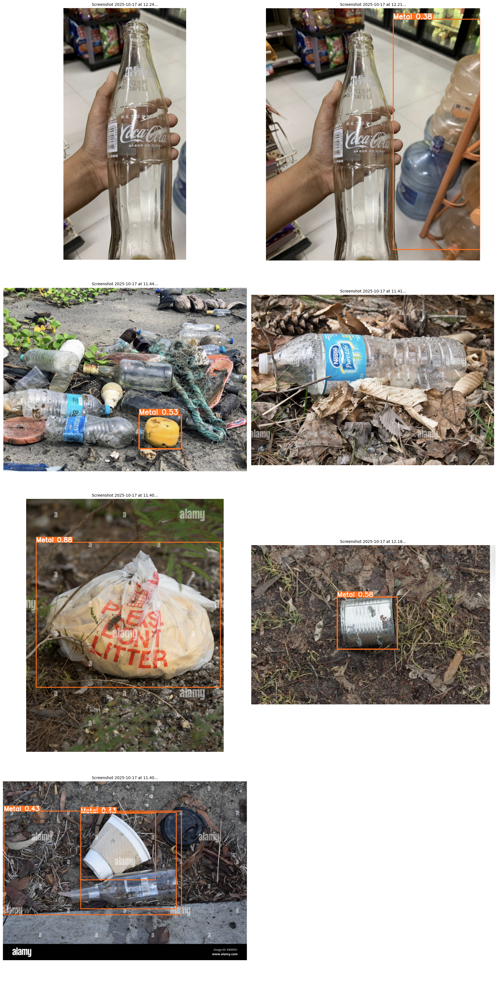


SUMMARY
Total images processed: 7
Model: /Users/dabeer/Documents/Crimson/Bill AI Immersive/runs/detect/recyclable_detection/weights/best.pt
Confidence threshold: 25%


In [26]:
import os
# Load the trained model
model_path = '/Users/dabeer/Documents/Crimson/Bill AI Immersive/runs/detect/recyclable_detection/weights/best.pt'

if not os.path.exists(model_path):
    print("⚠️  Model not found! Please download from iCloud first.")
    print(f"Looking for: {model_path}")
else:
    # Load model
    model = YOLO(model_path)
    print(f"✅ Model loaded from: {model_path}")
    print(f"Classes: {model.names}")
    
    # Get all images from Bill_images folder
    bill_images_dir = '/Users/dabeer/Documents/Crimson/Bill AI Immersive/Bill_images'
    image_files = [f for f in os.listdir(bill_images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    print(f"\nFound {len(image_files)} images to process")
    
    # Create subplots for all images
    num_images = len(image_files)
    cols = 2
    rows = (num_images + 1) // 2
    
    fig, axes = plt.subplots(rows, cols, figsize=(18, 9 * rows))
    if num_images == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    # Process each image
    for idx, img_file in enumerate(image_files):
        img_path = os.path.join(bill_images_dir, img_file)
        
        # Run prediction
        results = model.predict(img_path, conf=0.25, verbose=False)
        
        # Get the plotted image with predictions
        result_img = results[0].plot()
        result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        
        # Display image
        axes[idx].imshow(result_img)
        axes[idx].set_title(f"{img_file[:30]}...", fontsize=10)
        axes[idx].axis('off')
        
        # Print detection details
        print(f"\n{'='*60}")
        print(f"Image: {img_file}")
        print(f"{'='*60}")
        
        if len(results[0].boxes) > 0:
            print(f"✅ Detected {len(results[0].boxes)} object(s):")
            for i, box in enumerate(results[0].boxes):
                class_id = int(box.cls[0])
                confidence = float(box.conf[0])
                class_name = model.names[class_id]
                coords = box.xyxy[0].cpu().numpy()
                
                print(f"  {i+1}. {class_name}")
                print(f"     Confidence: {confidence:.2%}")
                print(f"     Location: [{coords[0]:.0f}, {coords[1]:.0f}, {coords[2]:.0f}, {coords[3]:.0f}]")
        else:
            print("❌ No recyclables detected")
    
    # Hide empty subplots
    for idx in range(num_images, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*60}")
    print("SUMMARY")
    print(f"{'='*60}")
    print(f"Total images processed: {num_images}")
    print(f"Model: {model_path}")
    print(f"Confidence threshold: 25%")


## Find Images Predicted as Glass


✅ Model loaded: {0: 'Plastic', 1: 'Glass', 2: 'Metal'}

🔍 Scanning 964 test images for Glass detections...
✅ Found 10 images with Glass predictions


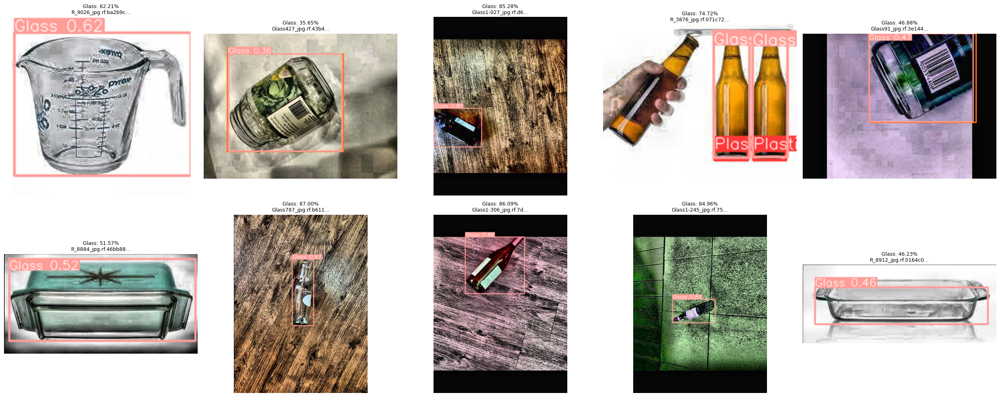


GLASS DETECTION DETAILS
1. R_9026_jpg.rf.ba2b9cfe65a77a259e894b25dd8cdadf.jpg
   Confidence: 62.21%
   - Glass: 62.21%

2. Glass427_jpg.rf.43b4ece36a53dbb84fd61755b5eb2892.jpg
   Confidence: 35.65%
   - Glass: 35.65%
   - Metal: 32.29%

3. Glass1-027_jpg.rf.d61638c65034c4171724138fb901bcbc.jpg
   Confidence: 85.28%
   - Glass: 85.28%

4. R_3876_jpg.rf.071c7225be921ff51604b5901409b58e.jpg
   Confidence: 74.72%
   - Glass: 74.72%
   - Glass: 73.71%
   - Plastic: 58.54%
   - Plastic: 43.67%

5. Glass91_jpg.rf.3e14448e087b84827735e642eed52a43.jpg
   Confidence: 46.88%
   - Glass: 46.88%
   - Metal: 39.57%

6. R_8884_jpg.rf.46bb88d9af0ad3839ae48f1b6e0467de.jpg
   Confidence: 51.57%
   - Glass: 51.57%

7. Glass787_jpg.rf.b611a88518a217ebb47dd27316dc62a3.jpg
   Confidence: 87.00%
   - Glass: 87.00%

8. Glass1-306_jpg.rf.7de6c7d40a125b56cb468435c45ea906.jpg
   Confidence: 86.09%
   - Glass: 86.09%

9. Glass1-245_jpg.rf.756aa83be08220f61ac0acdb08308d88.jpg
   Confidence: 84.96%
   - Glass: 84.

In [25]:
# Load the trained model
model_path = '/Users/dabeer/Documents/Crimson/Bill AI Immersive/runs/detect/recyclable_detection/weights/best.pt'

if not os.path.exists(model_path):
    print("⚠️  Model not found! Please download from iCloud first.")
else:
    model = YOLO(model_path)
    print(f"✅ Model loaded: {model.names}")
    
    # Get test images
    test_dir = '/Users/dabeer/Documents/Crimson/Bill AI Immersive/dataset/test/images'
    test_images = [f for f in os.listdir(test_dir) if f.endswith('.jpg')]
    
    # Find images with Glass predictions
    glass_predictions = []
    
    print(f"\n🔍 Scanning {len(test_images)} test images for Glass detections...")
    
    for img_name in test_images[:200]:  # Check first 200 images
        img_path = os.path.join(test_dir, img_name)
        results = model.predict(img_path, conf=0.25, verbose=False)
        
        # Check if Glass (class 1) was detected
        for box in results[0].boxes:
            class_id = int(box.cls[0])
            if class_id == 1:  # 1 = Glass
                confidence = float(box.conf[0])
                glass_predictions.append({
                    'image': img_name,
                    'path': img_path,
                    'confidence': confidence,
                    'results': results[0]
                })
                break  # Only need one detection per image
        
        if len(glass_predictions) >= 10:  # Stop after finding 10
            break
    
    print(f"✅ Found {len(glass_predictions)} images with Glass predictions")
    
    # Display the images
    if len(glass_predictions) > 0:
        num_to_show = min(10, len(glass_predictions))
        cols = 5
        rows = (num_to_show + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(25, 5 * rows))
        if num_to_show == 1:
            axes = [axes]
        else:
            axes = axes.flatten()
        
        for idx in range(num_to_show):
            item = glass_predictions[idx]
            
            # Plot the prediction
            result_img = item['results'].plot()
            result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
            
            axes[idx].imshow(result_img)
            axes[idx].set_title(f"Glass: {item['confidence']:.2%}\n{item['image'][:20]}...", fontsize=9)
            axes[idx].axis('off')
        
        # Hide empty subplots
        for idx in range(num_to_show, len(axes)):
            axes[idx].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Print details
        print("\n" + "="*70)
        print("GLASS DETECTION DETAILS")
        print("="*70)
        for idx, item in enumerate(glass_predictions[:10]):
            print(f"{idx+1}. {item['image']}")
            print(f"   Confidence: {item['confidence']:.2%}")
            
            # Show all detections in this image
            for box in item['results'].boxes:
                cls_id = int(box.cls[0])
                conf = float(box.conf[0])
                cls_name = model.names[cls_id]
                print(f"   - {cls_name}: {conf:.2%}")
            print()
    else:
        print("❌ No Glass detections found in test images")
